In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
from glob import glob
from pathlib import Path
import matplotlib.pyplot as plt
import pandas as pd 
import seaborn as sns
import matplotlib
from math import pow, sqrt, ceil
from collections import OrderedDict
import json
import cv2

In [3]:
import torch
import torchvision.transforms as transforms
import openslide
import torchvision
import fastai
from fastai.vision.learner import create_body 

In [4]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric
from object_detection_fastai.helper.nms_center_distance import non_max_suppression_by_distance

In [5]:
from object_detection_fastai.helper.BoundingBox import *
from object_detection_fastai.helper.BoundingBoxes import *
from object_detection_fastai.helper.Evaluator  import *

In [6]:
def rescale_box(bboxes, size: Tensor):
    bboxes[:, :2] = bboxes[:, :2] - bboxes[:, 2:] / 2
    bboxes[:, :2] = (bboxes[:, :2] + 1) * size / 2
    bboxes[:, 2:] = bboxes[:, 2:] * size / 2
    bboxes = bboxes.long()
    return bboxes

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [8]:
patches = list(Path("../Patches/").glob("*.tiff"))

In [9]:
gt_df = pd.read_csv(str(Path("../Patches/ground truth.txt")), sep ="|")
gt_df.head()

,file,class,vector,first_edit,first_time,last_edit,last_time,uuid,deleted,width,height
0,BAL 1 Spray 2_12186_5303_272_266.png,Makrophagen,"{""x1"": ""132"",""y1"": ""1"",""x2"": ""181"",""y2"": ""58"",}",Christof,2020-01-11 22:42:22.548465,Christof,2020-01-12 10:28:31.782411,e9440c22-7554-40ed-83fd-3842eb391cb7,False,272,266
1,BAL 1 Spray 2_12186_5303_272_266.png,Neutrophile,"{""x1"": ""208"",""y1"": ""103"",""x2"": ""255"",""y2"": ""15...",marzahl,2020-01-11 15:49:50.935888,Christof,2020-01-12 10:28:31.781671,bc51c1fb-d5d9-47e0-bb48-2859a5e57c83,False,272,266
2,BAL 1 Spray 2_12186_5303_272_266.png,Makrophagen,"{""x1"": ""21"",""y1"": ""5"",""x2"": ""75"",""y2"": ""64"",}",Christof,2020-01-11 21:57:42.560221,Christof,2020-01-12 10:28:31.715049,e1b5b4ed-1e40-4f34-8c26-4404fede076a,False,272,266
3,BAL 1 Spray 2_12186_5303_272_266.png,Makrophagen,"{""x1"": ""108"",""y1"": ""98"",""x2"": ""160"",""y2"": ""140"",}",Christof,2020-01-11 21:58:29.421053,Christof,2020-01-12 10:28:31.699968,5d713028-71d2-400f-a9a7-ab2a4c8d74a6,False,272,266
4,BAL 1 Spray 2_12186_5303_272_266.png,Lymohozyten,"{""x1"": ""72"",""y1"": ""81"",""x2"": ""118"",""y2"": ""127"",}",marzahl,2020-01-11 15:49:50.746330,Christof,2020-01-12 10:28:31.699286,b124b1b7-4e5a-4c4d-bf3d-69d643060931,True,272,266


In [10]:
model_file = Path("../Detection/Asthma-L0-Screening.p")

In [11]:
model_information = torch.load(model_file, map_location='cpu') \
                    if torch.cuda.is_available() ==  False \
                    else torch.load(model_file)

model_weights = model_information['model']
anchors = model_information["anchors"]
mean = model_information["mean"]
std = model_information["std"]
shape = model_information["size"]
n_classes = model_information['n_classes']
n_anchors = model_information['n_anchors']
sizes = model_information['sizes']
chs = model_information['chs']
encoder = model_information['encoder']
n_conv = model_information['n_conv']
level = model_information['level']

In [12]:
encoder = create_body(models.resnet18, False, -2)

model = RetinaNet(encoder, n_classes, n_anchors=n_anchors, sizes=sizes,
                                       chs=chs, n_conv=2)
model.load_state_dict(model_weights)
model.to(device)

RetinaNet(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=Tru

In [15]:
results = {}
classes = {#'background':0,
             0:'Eosinophile',
             1:'Lymohozyten',
             2:'Makrophagen',
             3:'Mastzellen',
             4:'Neutrophile'}

detect_thresh = 0.5

for f_name in list(patches):
    boxes = []
    slide = openslide.OpenSlide(filename=str(f_name))
    
    image_ori = slide.read_region(location=(0, 0), level=level, size=slide.dimensions)
    image = slide.read_region(location=(0, 0), level=level, size=(1024, 1024))
    patch = np.array(image)[:, :, :3]
    
    patch = pil2tensor(patch / 255., np.float32)
    patch = transforms.Normalize(mean, std)(patch)
    
    with torch.no_grad():
        class_pred, bbox_pred, _ = model(patch[None, :, :, :].to(device))
    
    bbox_pred, scores, preds = process_output(class_pred[0].cpu(), bbox_pred[0].cpu(), anchors, detect_thresh=detect_thresh)
    if bbox_pred is not None:
        to_keep = nms(bbox_pred, scores, 0.9)
        bbox_pred, preds, scores = bbox_pred[to_keep].cpu(), preds[to_keep].cpu(), scores[to_keep].cpu()
        
        t_sz = torch.Tensor([shape, shape])[None].float()
        bbox_pred = rescale_box(bbox_pred, t_sz)
        
        
        for box, pred, score in zip(bbox_pred, preds, scores):

            y_box, x_box = box[:2]
            h, w = box[2:4]

            x1 = int(x_box)
            y1 = int(y_box)
            x2 = x1 + int(w)
            y2 = y1 + int(h)

            boxes.append([x1, y1, x2, y2, int(pred), float(score), classes[int(pred)]])
    
    results[f_name.stem+".png"] = {
        "image": image,
        "boxes": boxes,
        "image_ori": image_ori
    }

d:\anaconda3\envs\eiph_wsi\lib\site-packages\object_detection_fastai\helper\object_detection_helper.py:157: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  ..\torch\csrc\utils\python_arg_parser.cpp:766.)
  if len(mask_keep.nonzero()) == 0: break


In [16]:
gt_df.head()

,file,class,vector,first_edit,first_time,last_edit,last_time,uuid,deleted,width,height
0,BAL 1 Spray 2_12186_5303_272_266.png,Makrophagen,"{""x1"": ""132"",""y1"": ""1"",""x2"": ""181"",""y2"": ""58"",}",Christof,2020-01-11 22:42:22.548465,Christof,2020-01-12 10:28:31.782411,e9440c22-7554-40ed-83fd-3842eb391cb7,False,272,266
1,BAL 1 Spray 2_12186_5303_272_266.png,Neutrophile,"{""x1"": ""208"",""y1"": ""103"",""x2"": ""255"",""y2"": ""15...",marzahl,2020-01-11 15:49:50.935888,Christof,2020-01-12 10:28:31.781671,bc51c1fb-d5d9-47e0-bb48-2859a5e57c83,False,272,266
2,BAL 1 Spray 2_12186_5303_272_266.png,Makrophagen,"{""x1"": ""21"",""y1"": ""5"",""x2"": ""75"",""y2"": ""64"",}",Christof,2020-01-11 21:57:42.560221,Christof,2020-01-12 10:28:31.715049,e1b5b4ed-1e40-4f34-8c26-4404fede076a,False,272,266
3,BAL 1 Spray 2_12186_5303_272_266.png,Makrophagen,"{""x1"": ""108"",""y1"": ""98"",""x2"": ""160"",""y2"": ""140"",}",Christof,2020-01-11 21:58:29.421053,Christof,2020-01-12 10:28:31.699968,5d713028-71d2-400f-a9a7-ab2a4c8d74a6,False,272,266
4,BAL 1 Spray 2_12186_5303_272_266.png,Lymohozyten,"{""x1"": ""72"",""y1"": ""81"",""x2"": ""118"",""y2"": ""127"",}",marzahl,2020-01-11 15:49:50.746330,Christof,2020-01-12 10:28:31.699286,b124b1b7-4e5a-4c4d-bf3d-69d643060931,True,272,266


In [74]:
boundingBoxes = BoundingBoxes()

for f_name in results:
    
    prediction = results[f_name]
    gt_annos = gt_df[(gt_df["file"] == f_name) & (gt_df["deleted"] == False)]

    gt_boxes = []
    for box in prediction["boxes"]:
        
        x,y,w,h = box[0], box[1], box[2] - box[0], box[3] - box[1]
        
        predBox = BoundingBox(imageName=f_name, classId=box[6], 
                                   x=x, y=y, 
                                   w=w, h=h,
                                   typeCoordinates=CoordinatesType.Absolute, classConfidence=box[-2],
                                   bbType=BBType.Detected, format=BBFormat.XYWH)
        
        boundingBoxes.addBoundingBox(predBox)
        
    for label, vector in zip(gt_annos["class"], gt_annos["vector"]):
        vector = json.loads(vector.replace(",}", "}"))
        
        x,y,w,h = int(vector["x1"]), int(vector["y1"]), int(vector["x2"]) - int(vector["x1"]), int(vector["y2"]) - int(vector["y1"])
        
        gt_boxes.append([x,y,x+w,y+h, label, 1, label])
        
        predBox = BoundingBox(imageName=f_name, classId=label, 
                                   x=x, y=y, 
                                   w=w, h=h,
                                   typeCoordinates=CoordinatesType.Absolute,
                                   bbType=BBType.GroundTruth, format=BBFormat.XYWH)
        
        boundingBoxes.addBoundingBox(predBox)
        
    results[f_name]["gt_boxes"] = gt_boxes
        
evaluator = Evaluator()
metricsPerClass = evaluator.GetPascalVOCMetrics(boundingBoxes, IOUThreshold=0.5)

In [75]:
np.mean([np.nan_to_num(mc['AP']) for mc in metricsPerClass])

0.7642358910150143

In [68]:
import matplotlib.pyplot as plt
import matplotlib.patches as plt_patches

def get_patch(x1, y1, x2, y2, label):
    
    color = 'r' # Neutrophile
    if label == "Eosinophile": # Eosinophile
        color = 'g'
    elif label == "Lymohozyten": # Lymohozyten
        color = 'b'
    elif label == "Makrophagen": # Makrophagen
        color = 'y'
    elif label == "Mastzellen": # Mastzellen
        color = 'm'
        
    rect = plt_patches.Rectangle((x1, y1),y2-y1, x2-x1,linewidth=2,edgecolor=color,facecolor='none')
    
    return rect

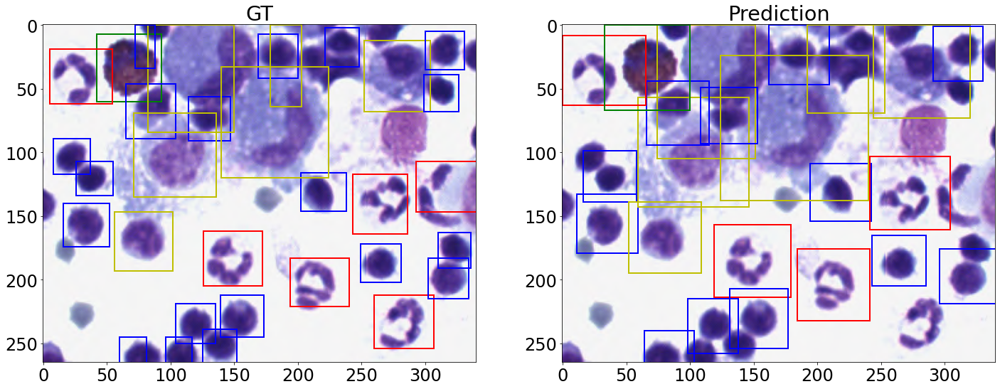

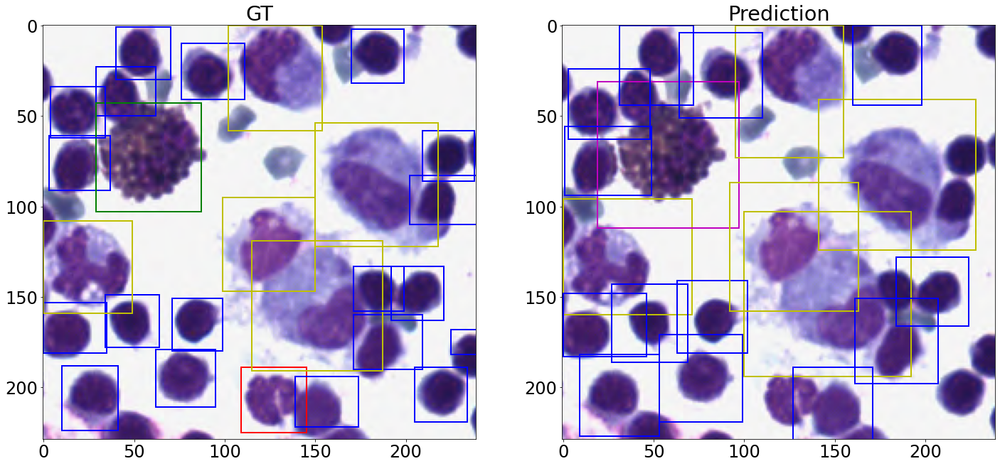

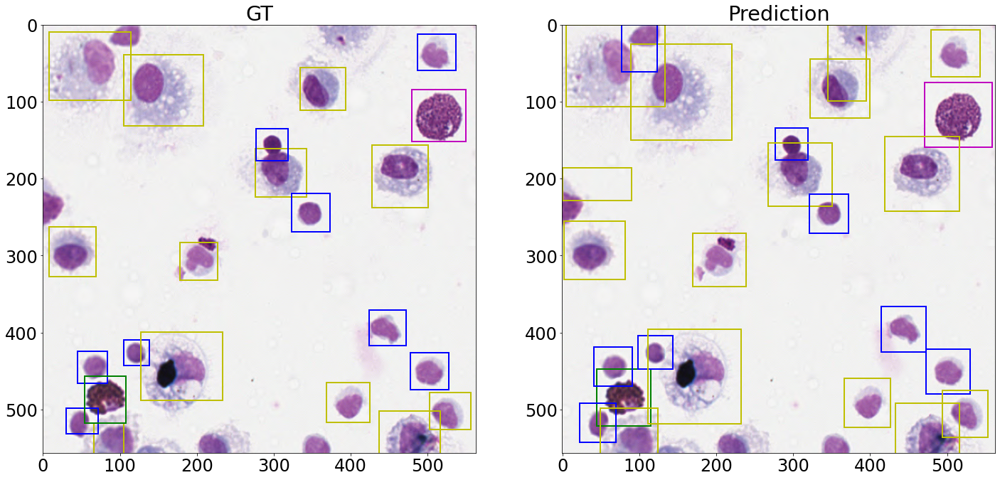

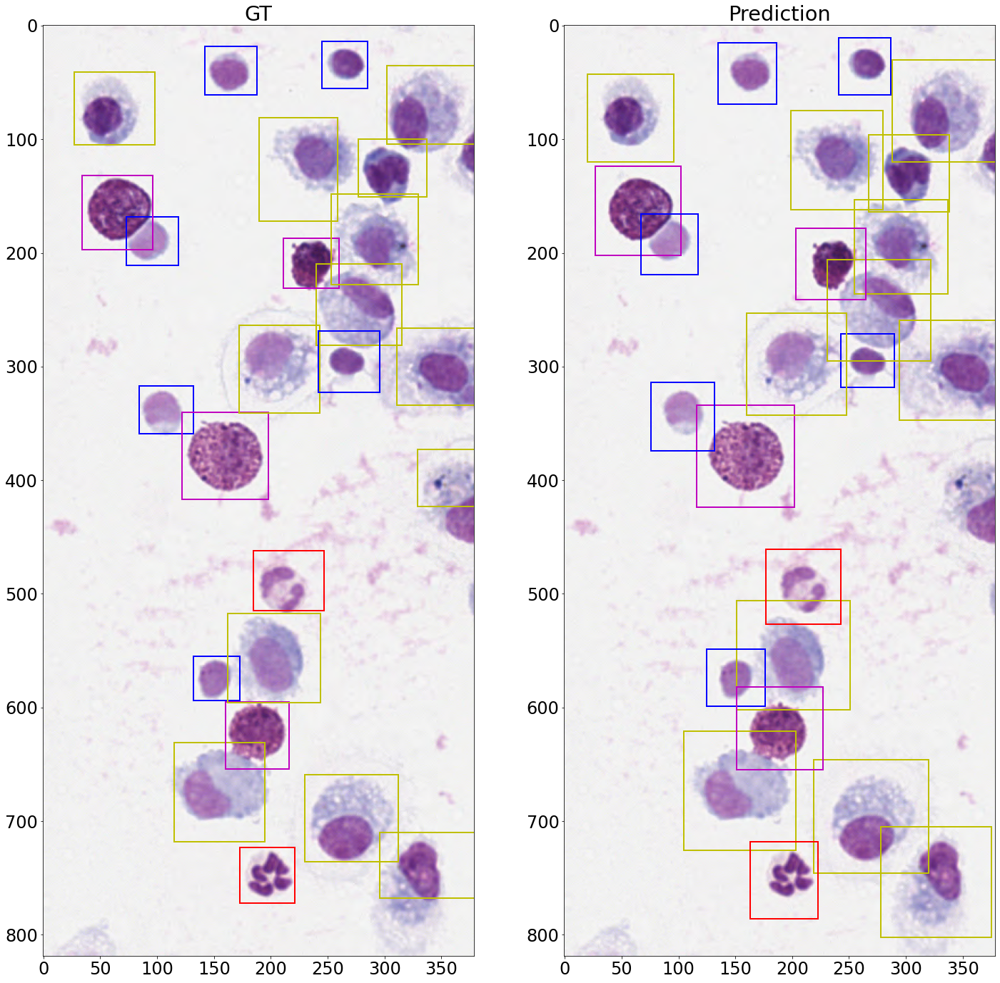

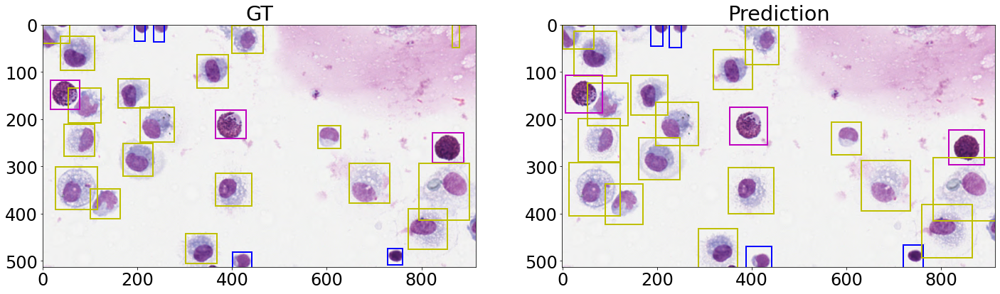

...

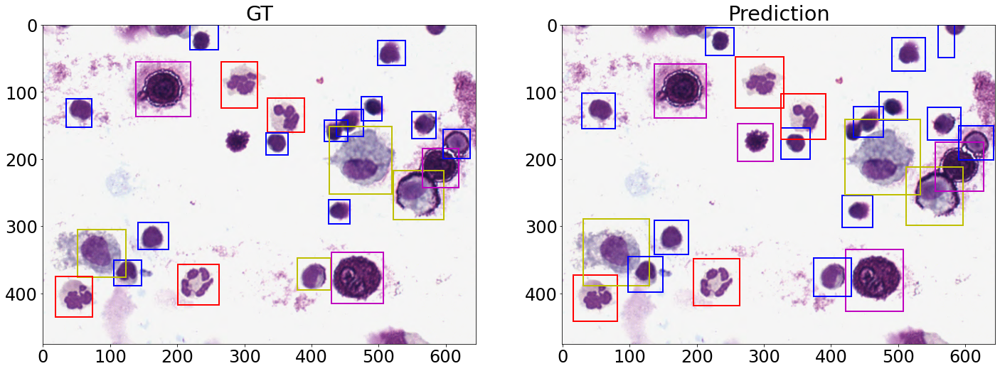

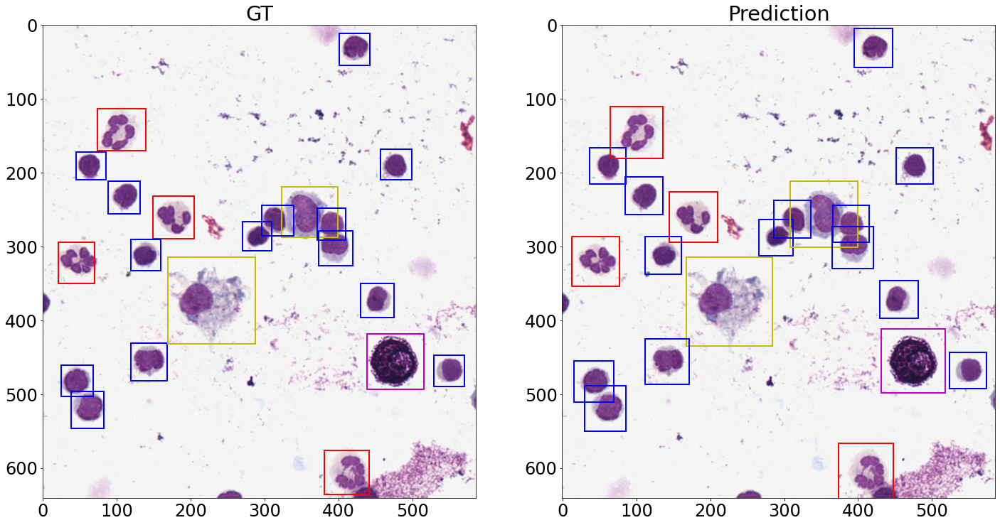

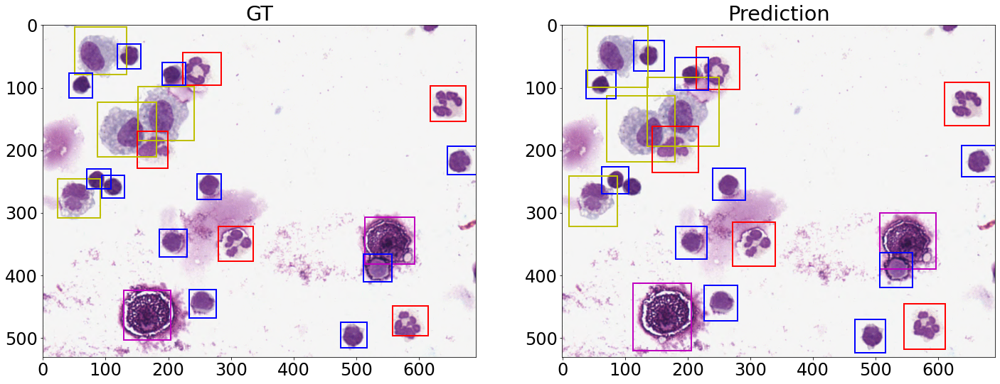

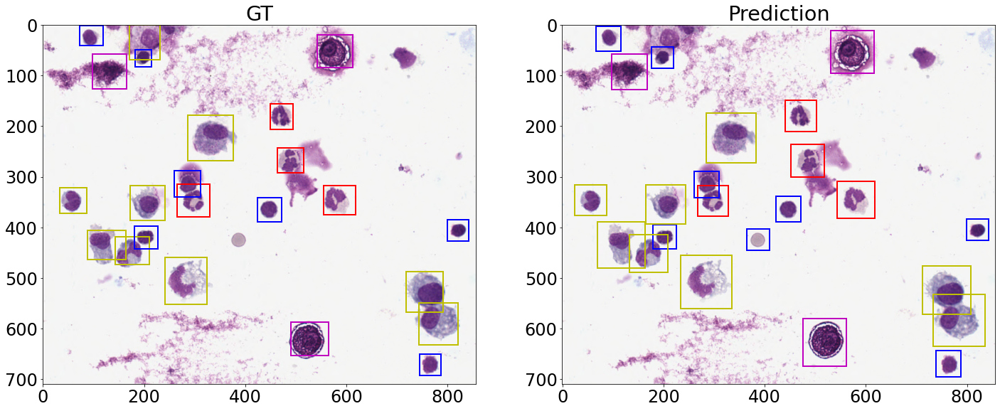

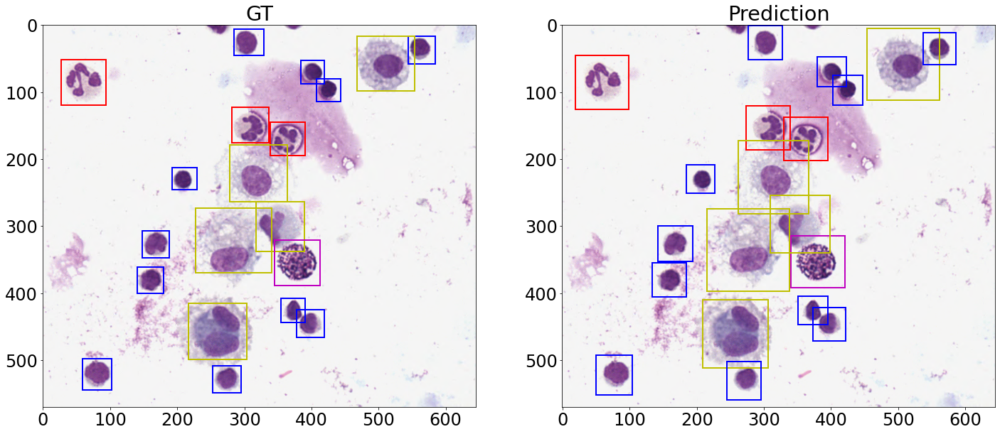

In [73]:
matplotlib.rcParams.update({'font.size': 24})
radius = 30
threshold = 0.3

for f_name in results:
    
    prediction = results[f_name]
    
    image = np.array(np.array(prediction["image_ori"])[:, :, :3])
    
    boxes = prediction["boxes"]
    temp_boxes = np.array(boxes)
    temp_boxes = temp_boxes[temp_boxes[:, 5].astype(float) > threshold]
    
    
    box_coordinates, scores = temp_boxes[:, :4].astype(int), temp_boxes[:, 5].astype(float)
    idx = non_max_suppression_by_distance(box_coordinates, scores, radius=radius, return_ids=True)
    temp_boxes = temp_boxes[idx]    

    
    gt_boxes = prediction["gt_boxes"]  
    f, axarr = plt.subplots(1,2, figsize=(24,24))
    gt_ax   = axarr[0]
    gt_ax.set_title('GT')
    
    for x1, y1, x2, y2, pred, score, label in gt_boxes:
        
        rect = get_patch(x1, y1, x2, y2, label)
        gt_ax.add_patch(rect)
    
    
    pred_ax = axarr[1]
    pred_ax.set_title('Prediction')
    
    for x1, y1, x2, y2, pred, score, label in temp_boxes:
        
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
    
        rect = get_patch(x1, y1, x2, y2, label)
        pred_ax.add_patch(rect)
    
    
    gt_ax.imshow(image)
    pred_ax.imshow(image)
    
    plt.show()
    
    

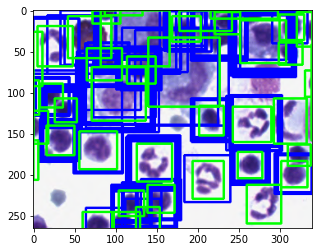

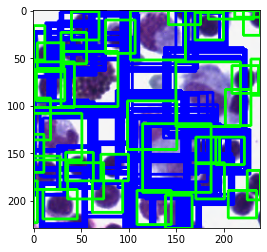

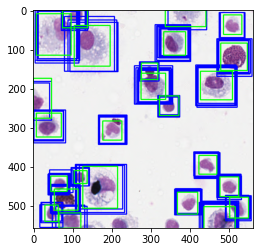

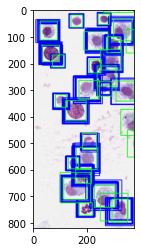

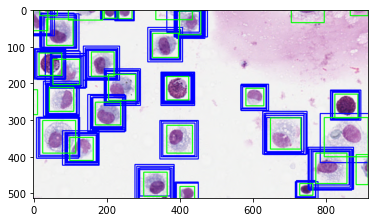

...

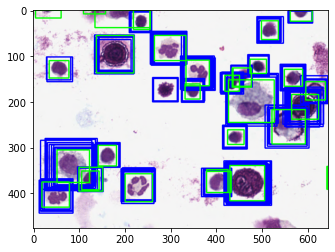

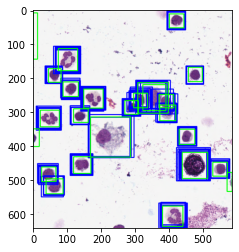

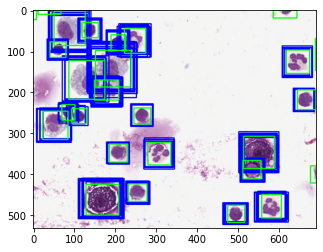

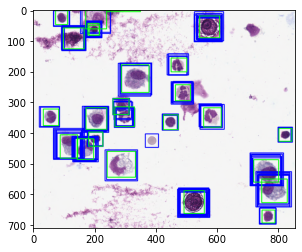

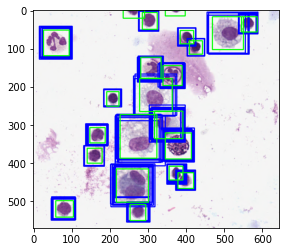

In [19]:
for f_name in results:
    
    prediction = results[f_name]
    image = np.array(np.array(prediction["image_ori"])[:, :, :3])

    im = boundingBoxes.drawAllBoundingBoxes(image, f_name)
    
    plt.imshow(im)
    plt.show()